# Human Connectome Project (HCP) Dataset loader

The HCP dataset comprises resting-state and task-based fMRI from a large sample of human subjects. The NMA-curated dataset includes time series data that has been preprocessed and spatially-downsampled by aggregating within 360 regions of interest.

In [ ]:
# @title Install dependencies
!pip install nilearn --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 15.0 MB/s eta 0:00:00


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Necessary for visualization
from nilearn import plotting, datasets

In [ ]:
#@title Figure settings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/master/nma.mplstyle")

# Basic parameters

In [ ]:
# The download cells will store the data in nested directories starting here:
HCP_DIR = "./DATA"
if not os.path.isdir(HCP_DIR):
  os.mkdir(HCP_DIR)

# The data shared for NMA projects is a subset of the full HCP dataset
N_SUBJECTS = 338

# The data have already been aggregated into ROIs from the Glasesr parcellation
N_PARCELS = 360

# The acquisition parameters for all tasks were identical
TR = 0.72  # Time resolution, in sec

# The parcels are matched across hemispheres with the same order
HEMIS = ["Right", "Left"]

# Each experiment was repeated multiple times in each subject
N_RUNS_REST = 4
N_RUNS_TASK = 2

# Time series data are organized by experiment, with each experiment
# having an LR and RL (phase-encode direction) acquistion
BOLD_NAMES = [
  "rfMRI_REST1_LR", "rfMRI_REST1_RL",
  "rfMRI_REST2_LR", "rfMRI_REST2_RL",
  "tfMRI_MOTOR_RL", "tfMRI_MOTOR_LR",
  "tfMRI_WM_RL", "tfMRI_WM_LR",
  "tfMRI_EMOTION_RL", "tfMRI_EMOTION_LR",
  "tfMRI_GAMBLING_RL", "tfMRI_GAMBLING_LR",
  "tfMRI_LANGUAGE_RL", "tfMRI_LANGUAGE_LR",
  "tfMRI_RELATIONAL_RL", "tfMRI_RELATIONAL_LR",
  "tfMRI_SOCIAL_RL", "tfMRI_SOCIAL_LR"
]

# You may want to limit the subjects used during code development.
# This will use all subjects:
subjects = range(N_SUBJECTS)

# Downloading data

The rest and task data are shared in different files, but they will unpack into the same directory structure.

Each file is fairly large and will take some time to download. If you are focusing only on rest or task analyses, you may not want to download only that dataset.

We also separately provide some potentially useful behavioral covariate information.

In [ ]:
# @title Download the data

# @markdown Task data in `HCP_DIR/hcp_task`, rest in `HCP_DIR/hcp_rest`, covariate in `HCP_DIR/hcp`

import os, requests, tarfile

fnames = ["hcp_rest.tgz",
          "hcp_task.tgz",
          "hcp_covariates.tgz",
          "atlas.npz"]
urls = ["https://osf.io/bqp7m/download",
        "https://osf.io/s4h8j/download",
        "https://osf.io/x5p4g/download",
        "https://osf.io/j5kuc/download"]

for fname, url in zip(fnames, urls):
  if not os.path.isfile(fname):
    try:
      r = requests.get(url)
    except requests.ConnectionError:
      print("!!! Failed to download data !!!")
    else:
      if r.status_code != requests.codes.ok:
        print("!!! Failed to download data !!!")
      else:
        print(f"Downloading {fname}...")
        with open(fname, "wb") as fid:
          fid.write(r.content)
        print(f"Download {fname} completed!")

Download hcp_rest.tgz completed!
Download hcp_task.tgz completed!
Download hcp_covariates.tgz completed!
Download atlas.npz completed!


In [ ]:
# @title Extract the data in `HCP_DIR`
fnames = ["hcp_covariates", "hcp_rest", "hcp_task"]

for fname in fnames:
  # open file
  path_name = os.path.join(HCP_DIR, fname)
  if not os.path.exists(path_name):
    print(f"Extracting {fname}.tgz...")
    with tarfile.open(f"{fname}.tgz") as fzip:
      fzip.extractall(HCP_DIR)
  else:
    print(f"File {fname}.tgz has already been extracted.")

Extracting hcp_covariates.tgz...
Extracting hcp_rest.tgz...
Extracting hcp_task.tgz...


## Loading region information

Downloading either dataset will create the `regions.npy` file, which contains the region name and network assignment for each parcel.

Detailed information about the name used for each region is provided [in the Supplement](https://static-content.springer.com/esm/art%3A10.1038%2Fnature18933/MediaObjects/41586_2016_BFnature18933_MOESM330_ESM.pdf) to [Glasser et al. 2016](https://www.nature.com/articles/nature18933).

Information about the network parcellation is provided in [Ji et al, 2019](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6289683/).

In [ ]:
dir = os.path.join(HCP_DIR, "hcp_task")  # choose the data directory
regions = np.load(os.path.join(dir, "regions.npy")).T
region_info = dict(name=regions[0].tolist(),
                   network=regions[1],
                   myelin=regions[2].astype(float)
                   )

We also provide the [parcellation on the fsaverage5 surface](https://figshare.com/articles/HCP-MMP1_0_projected_on_fsaverage/3498446) and approximate MNI coordinates of each region, which can be useful for visualization:

In [ ]:
with np.load(f"atlas.npz") as dobj:
  atlas = dict(**dobj)

# Helper functions


## Data loading

In [ ]:
def get_image_ids(name):
  """Get the 1-based image indices for runs in a given experiment.

    Args:
      name (str) : Name of experiment ("rest" or name of task) to load
    Returns:
      run_ids (list of int) : Numeric ID for experiment image files

  """
  run_ids = [
             i for i, code in enumerate(BOLD_NAMES, 1) if name.upper() in code
             ]
  if not run_ids:
    raise ValueError(f"Found no data for '{name}'")
  return run_ids


def load_timeseries(subject, name, dir,
                    runs=None, concat=True, remove_mean=True):
  """Load timeseries data for a single subject.

  Args:
    subject (int): 0-based subject ID to load
    name (str) : Name of experiment ("rest" or name of task) to load
    dir (str) : data directory
    run (None or int or list of ints): 0-based run(s) of the task to load,
      or None to load all runs.
    concat (bool) : If True, concatenate multiple runs in time
    remove_mean (bool) : If True, subtract the parcel-wise mean

  Returns
    ts (n_parcel x n_tp array): Array of BOLD data values

  """
  # Get the list relative 0-based index of runs to use
  if runs is None:
    runs = range(N_RUNS_REST) if name == "rest" else range(N_RUNS_TASK)
  elif isinstance(runs, int):
    runs = [runs]

  # Get the first (1-based) run id for this experiment
  offset = get_image_ids(name)[0]

  # Load each run's data
  bold_data = [
               load_single_timeseries(subject,
                                      offset + run,
                                      dir,
                                      remove_mean) for run in runs
               ]

  # Optionally concatenate in time
  if concat:
    bold_data = np.concatenate(bold_data, axis=-1)

  return bold_data


def load_single_timeseries(subject, bold_run, dir, remove_mean=True):
  """Load timeseries data for a single subject and single run.

  Args:
    subject (int): 0-based subject ID to load
    bold_run (int): 1-based run index, across all tasks
    dir (str) : data directory
    remove_mean (bool): If True, subtract the parcel-wise mean

  Returns
    ts (n_parcel x n_timepoint array): Array of BOLD data values

  """
  bold_path = os.path.join(dir, "subjects", str(subject), "timeseries")
  bold_file = f"bold{bold_run}_Atlas_MSMAll_Glasser360Cortical.npy"
  ts = np.load(os.path.join(bold_path, bold_file))
  if remove_mean:
    ts -= ts.mean(axis=1, keepdims=True)
  return ts


def load_evs(subject, name, condition, dir):
  """Load EV (explanatory variable) data for one task condition.

  Args:
    subject (int): 0-based subject ID to load
    name (str) : Name of task
    condition (str) : Name of condition
    dir (str) : data directory

  Returns
    evs (list of dicts): A dictionary with the onset, duration, and amplitude
      of the condition for each run.

  """
  evs = []
  for id in get_image_ids(name):
    task_key = BOLD_NAMES[id - 1]
    ev_file = os.path.join(dir, "subjects", str(subject), "EVs",
                           task_key, f"{condition}.txt")
    ev_array = np.loadtxt(ev_file, ndmin=2, unpack=True)
    ev = dict(zip(["onset", "duration", "amplitude"], ev_array))
    evs.append(ev)
  return evs

def load_evs_v2(subject, name, condition, dir):
  """Load EV (explanatory variable) data for one task condition.

  Args:
    subject (int): 0-based subject ID to load
    name (str) : Name of task
    condition (str) : Name of condition
    dir (str) : data directory

  Returns
    evs (list of dicts): A dictionary with the onset, duration, and amplitude
      of the condition for each run.

  """
  evs = []
  for id in get_image_ids(name):
    task_key = BOLD_NAMES[id - 1]
    ev_file = os.path.join(dir, "subjects", str(subject), "EVs",
                           task_key, f"{condition}.txt")
    ev_array = np.loadtxt(ev_file, ndmin=2, unpack=True)
    ev = dict(zip(["onset", "duration"], ev_array))
    evs.append(ev)
  return evs

## Task-based analysis

In [ ]:
def condition_frames_v2(run_evs, num_measurements=5, skip=0):
    """Identify timepoints corresponding to a given condition in each run.

    Args:
        run_evs (list of dicts): Onset and duration of the event, per run
        num_measurements (int): Number of measurements to take after each onset
        skip (int): Ignore this many frames at the start of each trial, to account
            for hemodynamic lag

    Returns:
        frames_list (list of 1D arrays): Flat arrays of frame indices, per run
    """
    frames_list = []
    for ev in run_evs:
        # Determine when trial starts, rounded down
        start = np.floor(ev["onset"] / TR).astype(int)

        # Take the next num_measurements frames after each onset
        frames = [s + np.arange(skip, skip + num_measurements) for s in start]

        frames_list.append(frames)

    return frames_list

def selective_average_v2(timeseries_data, ev, num_measurements=5, skip=0):
    """Take the temporal mean across frames for a given condition.

    Args:
        timeseries_data (array or list of arrays): n_parcel x n_tp arrays
        ev (dict or list of dicts): Condition timing information
        num_measurements (int): Number of measurements to take after each onset
        skip (int): Ignore this many frames at the start of each trial, to account
            for hemodynamic lag

    Returns:
        avg_data_list (list of 2D arrays): List of arrays with averaged data per onset
    """
    # Ensure that we have lists of the same length
    if not isinstance(timeseries_data, list):
        timeseries_data = [timeseries_data]
    if not isinstance(ev, list):
        ev = [ev]
    if len(timeseries_data) != len(ev):
        raise ValueError("Length of `timeseries_data` and `ev` must match.")

    # Identify the indices of relevant frames
    frames = condition_frames_v2(ev, num_measurements, skip)

    avg_data_list = []

    # Select the frames from each image
    for run_data, run_frames in zip(timeseries_data, frames):
        run_avg_data = []
        for trial_frames in run_frames:
            trial_frames = trial_frames[trial_frames < run_data.shape[1]]
            avg_data = run_data[:, trial_frames].mean(axis=1)  # Average across the frames
            run_avg_data.append(avg_data)
        avg_data_list.append(np.array(run_avg_data))

    return avg_data_list



In [ ]:
timeseries_task = []
for subject in subjects:
  timeseries_task.append(load_timeseries(subject, "gambling",
                                         dir=os.path.join(HCP_DIR, "hcp_task"),
                                         concat=False))

## Load individual runs for a given task

Load each subject's data for a specific task, separately for each run:

## Run a simple subtraction analysis

In [ ]:
task = "gambling"
conditions = ["loss_event", "win_event"]  # Run a substraction analysis between two conditions

win = []
loss = []

for subject in subjects:

  # Get the average signal in each region for each condition
  loss_evs = load_evs_v2(subject, task, "loss_event", dir=os.path.join(HCP_DIR, "hcp_task"))
  loss_avgs = selective_average_v2(timeseries_task[subject], loss_evs)

  win_evs = load_evs_v2(subject, task, "win_event", dir=os.path.join(HCP_DIR, "hcp_task"))
  win_avgs = selective_average_v2(timeseries_task[subject], win_evs)

  all_loss = np.concatenate(loss_avgs, axis=0)
  all_win = np.concatenate(win_avgs, axis=0)

  loss.append(all_loss)
  win.append(all_win)

# SVC


In [ ]:
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import LeaveOneGroupOut, cross_validate
from sklearn.metrics import roc_auc_score
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category = ConvergenceWarning)

In [ ]:
svc_mean_acc_scores_all = []
svc_std_acc_scores_all = []
svc_feature_weights_all = []
Y = np.concatenate((np.zeros((29, 1)), np.ones((29, 1))), axis=0)
y = Y.squeeze()
runs = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]

for subject in subjects:

  X = np.vstack((loss[subject], win[subject]))

  # Create the output array with the specified outputs

  lsvc = LinearSVC()

  logo = LeaveOneGroupOut()
  logo.split(X, y, runs)

  scores_by_run = cross_validate(lsvc, X, y, cv = logo, groups = runs)

  mean_score = scores_by_run['test_score'].mean()
  std_score = scores_by_run['test_score'].std()

  svc_mean_acc_scores_all.append(mean_score)
  svc_std_acc_scores_all.append(std_score)

  lsvc.fit(X,y)
  feature_weights = lsvc.coef_[0]
  feature_weights_list = list(enumerate(feature_weights))
  feature_names = region_info["name"]

  svc_feature_weights_all.append(feature_weights_list)


In [ ]:
len(svc_mean_acc_scores_all)

338

(array([ 4., 12., 26., 43., 85., 54., 74., 29.,  8.,  3.]),
 array([0.39655172, 0.43965517, 0.48275862, 0.52586207, 0.56896552,
        0.61206897, 0.65517241, 0.69827586, 0.74137931, 0.78448276,
        0.82758621]),
 <BarContainer object of 10 artists>)

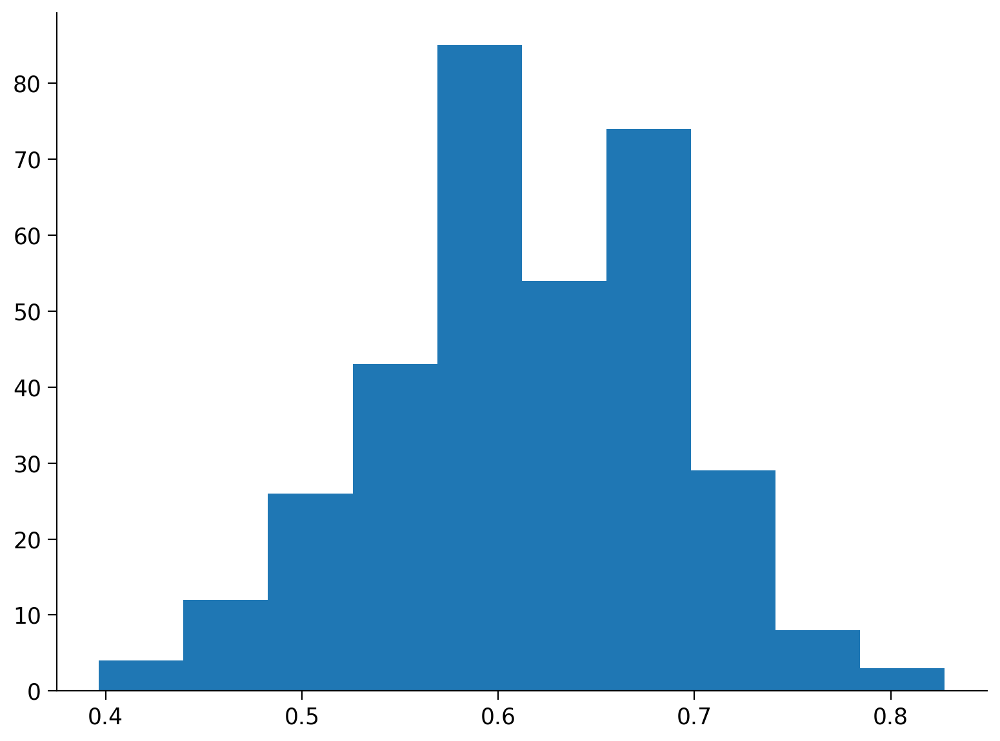

In [ ]:
plt.hist(svc_mean_acc_scores_all)

In [ ]:
import numpy as np

# Assuming feature_weights_all is a list of 214 elements, each containing a list of lists or numpy array of shape (360, 2)
# Each array has two columns: first column is index numbers, second column is feature weights

def average_feature_weights(feature_weights_all):
    num_subjects = len(feature_weights_all)

    # Initialize an array to hold the sum of weights for each feature index
    total_weights = np.zeros(360)

    # Iterate over each subject
    for subject in feature_weights_all:
        # Convert subject data to numpy array if it's not already
        subject_array = np.array(subject)

        # Extract the feature weights (second column)
        weights = subject_array[:, 1]

        # Accumulate the weights
        total_weights += weights

    # Calculate the average weights
    average_weights = total_weights / num_subjects

    return average_weights

# Example usage
# feature_weights_all = [subject_1_data, subject_2_data, ..., subject_214_data]
# Each subject_x_data is a list of lists or numpy array of shape (360, 2)

# Calculate the average feature weights
average_weights = average_feature_weights(svc_feature_weights_all)

In [ ]:
# Create a list of tuples containing feature indices and corresponding weights
feature_weights_list = list(enumerate(average_weights))
feature_name_list = [feature_weights_list[i] + (feature_names[i],) for i in range(len(feature_weights_list))]
# Sort the feature weights in descending order of absolute values
sorted_feature_weights = sorted(feature_name_list, key=lambda x: x[1], reverse = True)
top_10_features = sorted_feature_weights[:10]

In [ ]:
top_feature_indices = []
top_feature_names = []
top_feature_weights = []
for i in range(len(top_10_features)):
    top_feature_indices.append(top_10_features[i][0])
    top_feature_weights.append(top_10_features[i][1])
    top_feature_names.append(top_10_features[i][2])

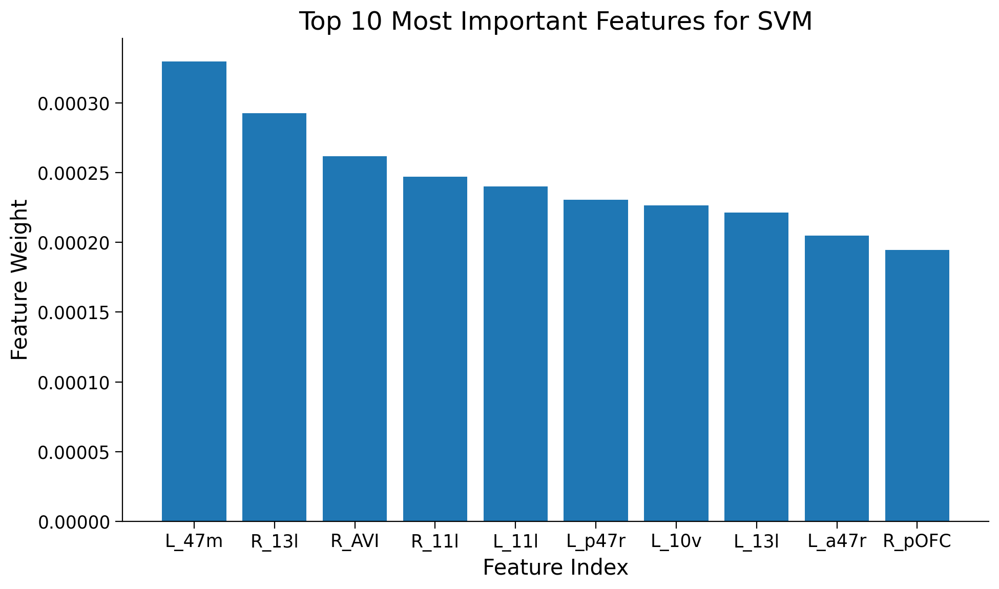

In [ ]:
# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(top_feature_names)), top_feature_weights, align='center')
plt.xticks(range(len(top_feature_names)), top_feature_names)
plt.xlabel('Feature Index')
plt.ylabel('Feature Weight')
plt.title('Top 10 Most Important Features for SVM')
plt.show()

In [ ]:
import numpy as np
from nilearn import plotting, datasets

# Assuming 'average_weights' is the array of average feature weights
# Assuming 'top_feature_indices' is the list of indices of the top 10 features

# Create a mask for the top 10 features
top_10_mask = np.zeros_like(average_weights)
for index in top_feature_indices:
    top_10_mask[index] = average_weights[index]

# Fetch fsaverage dataset for surface plotting
fsaverage = datasets.fetch_surf_fsaverage()

# Visualize the left hemisphere
surf_contrast = top_10_mask[atlas["labels_L"]]
plotting.view_surf(fsaverage['infl_left'],
                          surf_contrast,
                          vmax=.0003,
                          title='Top 10 Feature Weights (Left Hemisphere)')

In [ ]:
# If you also want to visualize the right hemisphere, repeat for the right side
surf_contrast_right = top_10_mask[atlas["labels_R"]]
plotting.view_surf(fsaverage['infl_right'],
                                surf_contrast_right,
                                vmax=.0003,
                                title='Top 10 Feature Weights (Right Hemisphere)')

In [ ]:
# This uses the nilearn package
from nilearn import plotting, datasets

# Try both hemispheres (L->R and left->right)
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast = average_weights[atlas["labels_L"]]
plotting.view_surf(fsaverage['infl_left'],
                   surf_contrast,
                   vmax=.0003)


In [ ]:
fsaverage = datasets.fetch_surf_fsaverage()
surf_contrast = average_weights[atlas["labels_R"]]
plotting.view_surf(fsaverage['infl_right'],
                   surf_contrast,
                   vmax=.0003)

In [ ]:
# Assuming svc_mean_acc_scores_all contains the mean accuracy scores for each subject
# and subjects contains the corresponding subject names

# Combine subjects and their mean accuracy scores into a list of tuples
subject_scores = list(zip(subjects, svc_mean_acc_scores_all))

# Sort the list by mean accuracy scores in descending order
sorted_subject_scores = sorted(subject_scores, key=lambda x: x[1], reverse=True)

# Get the top 10 subjects with the best accuracy scores
top_10_subjects = sorted_subject_scores[:10]

# Extract the subject names and their scores
top_10_subject_names = [subject for subject, score in top_10_subjects]
top_10_subject_scores = [score for subject, score in top_10_subjects]

# Print the top 10 subjects and their scores
print("Top 10 subjects with the best accuracy scores:")
for subject, score in zip(top_10_subject_names, top_10_subject_scores):
    print(f"Subject: {subject}, Accuracy Score: {score}")


Top 10 subjects with the best accuracy scores:
Subject: 15, Accuracy Score: 0.8275862068965517
Subject: 213, Accuracy Score: 0.8103448275862069
Subject: 301, Accuracy Score: 0.8103448275862069
Subject: 28, Accuracy Score: 0.7758620689655172
Subject: 202, Accuracy Score: 0.7758620689655172
Subject: 47, Accuracy Score: 0.7586206896551724
Subject: 67, Accuracy Score: 0.7586206896551724
Subject: 226, Accuracy Score: 0.7586206896551724
Subject: 85, Accuracy Score: 0.7413793103448276
Subject: 97, Accuracy Score: 0.7413793103448276


# RF

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import LeaveOneGroupOut, cross_validate
import numpy as np

rf_mean_acc_scores_all = []
rf_std_acc_scores_all = []
rf_feature_weights_all = []
Y = np.concatenate((np.zeros((29, 1)), np.ones((29, 1))), axis=0)
y = Y.squeeze()
runs = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]

for subject in subjects:

    X = np.vstack((loss[subject], win[subject]))

    # Initialize RandomForest model
    forest = RandomForestClassifier()

    # Define LeaveOneGroupOut cross-validation
    logo = LeaveOneGroupOut()
    logo.split(X, y, runs)

    # Perform cross-validation
    scores_by_run = cross_validate(forest, X, y, cv=logo, groups=runs)

    forest_mean_score = scores_by_run['test_score'].mean()
    forest_std_score = scores_by_run['test_score'].std()

    rf_mean_acc_scores_all.append(forest_mean_score)
    rf_std_acc_scores_all.append(forest_std_score)

    # Fit the model and get feature importances
    forest.fit(X, y)
    forest_feature_importances = forest.feature_importances_

    # Create a list of feature indices and their importances
    feature_importances_list = list(enumerate(forest_feature_importances))
    rf_feature_weights_all.append(feature_importances_list)



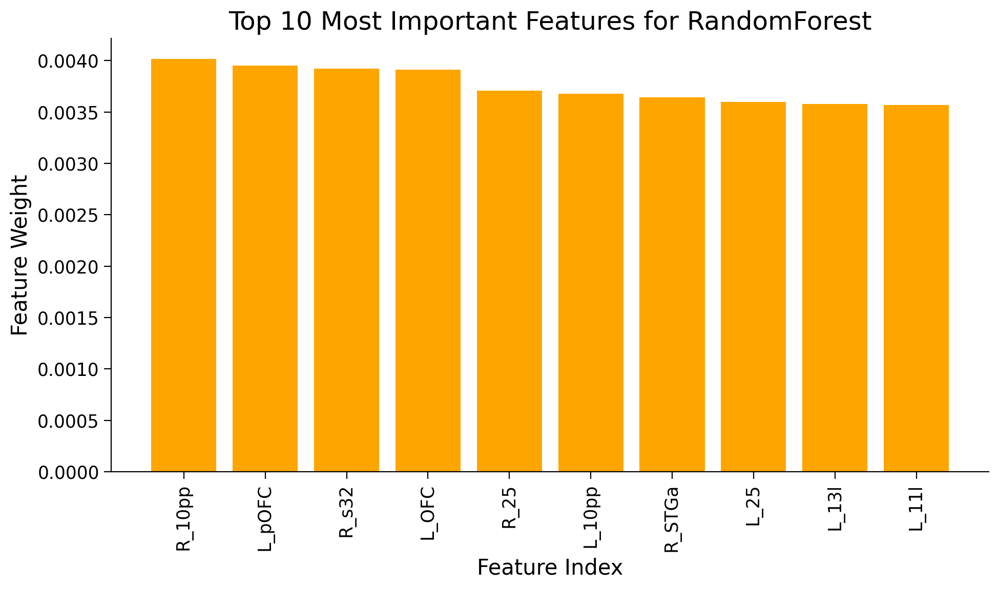

In [ ]:
# feature_names should be the same as in the SVM case
feature_names = region_info["name"]

# Calculate average feature importances from all subjects
def average_feature_importances(feature_importances_all):
    num_subjects = len(feature_importances_all)
    total_importances = np.zeros(360)
    for subject in feature_importances_all:
        subject_array = np.array(subject)
        importances = subject_array[:, 1]
        total_importances += importances
    average_importances = total_importances / num_subjects
    return average_importances

average_importances = average_feature_importances(rf_feature_weights_all)

# Create a list of tuples containing feature indices and corresponding importances
feature_importances_list = list(enumerate(average_importances))
feature_name_list = [feature_importances_list[i] + (feature_names[i],) for i in range(len(feature_importances_list))]

# Sort the feature importances in descending order
sorted_feature_importances = sorted(feature_name_list, key=lambda x: x[1], reverse=True)
top_10_features = sorted_feature_importances[:10]

# Extract top feature indices, names, and importances
top_feature_indices = [feature[0] for feature in top_10_features]
top_feature_names = [feature[2] for feature in top_10_features]
top_feature_importances = [feature[1] for feature in top_10_features]

# Plot the feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(range(len(top_feature_names)), top_feature_importances, align='center', color="Orange")
plt.xticks(range(len(top_feature_names)), top_feature_names, rotation=90)
plt.xlabel('Feature Index')
plt.ylabel('Feature Weight')
plt.title('Top 10 Most Important Features for RandomForest')
plt.show()

(array([ 2.,  2., 14., 46., 58., 67., 85., 32., 29.,  3.]),
 array([0.36206897, 0.40517241, 0.44827586, 0.49137931, 0.53448276,
        0.57758621, 0.62068966, 0.6637931 , 0.70689655, 0.75      ,
        0.79310345]),
 <BarContainer object of 10 artists>)

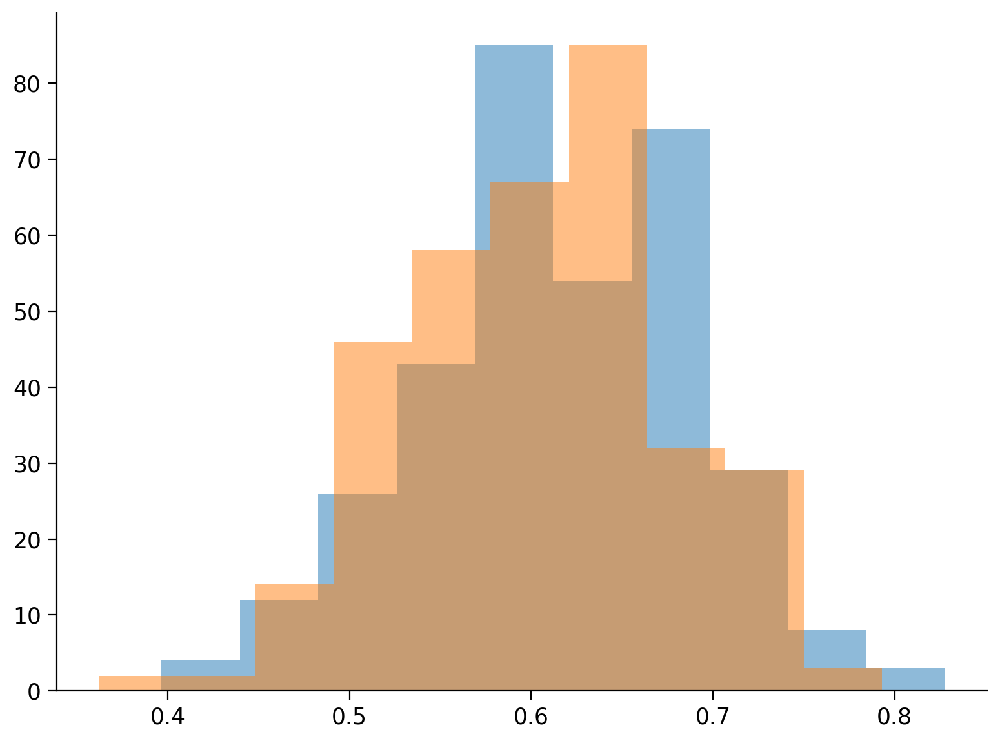

In [ ]:
plt.hist(svc_mean_acc_scores_all, alpha = 0.5 )
plt.hist(rf_mean_acc_scores_all, alpha = 0.5)

In [ ]:
# Assuming 'average_weights' is the array of average feature weights
# Assuming 'top_feature_indices' is the list of indices of the top 10 features

# Create a mask for the top 10 features
top_10_mask = np.zeros_like(average_weights)
for index in top_feature_indices:
    top_10_mask[index] = average_weights[index]

# Fetch fsaverage dataset for surface plotting
fsaverage = datasets.fetch_surf_fsaverage()

# Visualize the left hemisphere
surf_contrast = top_10_mask[atlas["labels_L"]]
plotting.view_surf(fsaverage['infl_left'],
                          surf_contrast,
                          vmax=.0003,
                          title='Top 10 Feature Weights (Left Hemisphere)')

In [ ]:
# If you also want to visualize the right hemisphere, repeat for the right side
surf_contrast_right = top_10_mask[atlas["labels_R"]]
plotting.view_surf(fsaverage['infl_right'],
                                surf_contrast_right,
                                vmax=.0003,
                                title='Top 10 Feature Weights (Right Hemisphere)')

In [ ]:
# Combine subjects and their mean accuracy scores into a list of tuples
subject_scores = list(zip(subjects, rf_mean_acc_scores_all))

# Sort the list by mean accuracy scores in descending order
sorted_subject_scores = sorted(subject_scores, key=lambda x: x[1], reverse=True)

# Get the top 10 subjects with the best accuracy scores
top_10_subjects = sorted_subject_scores[:10]

# Extract the subject names and their scores
top_10_subject_names = [subject for subject, score in top_10_subjects]
top_10_subject_scores = [score for subject, score in top_10_subjects]

# Print the top 10 subjects and their scores
print("Top 10 subjects with the best accuracy scores:")
for subject, score in zip(top_10_subject_names, top_10_subject_scores):
    print(f"Subject: {subject}, Accuracy Score: {score}")

Top 10 subjects with the best accuracy scores:
Subject: 301, Accuracy Score: 0.7931034482758621
Subject: 67, Accuracy Score: 0.7586206896551724
Subject: 334, Accuracy Score: 0.7586206896551724
Subject: 57, Accuracy Score: 0.7413793103448276
Subject: 70, Accuracy Score: 0.7413793103448276
Subject: 145, Accuracy Score: 0.7413793103448276
Subject: 226, Accuracy Score: 0.7413793103448276
Subject: 257, Accuracy Score: 0.7413793103448276
Subject: 4, Accuracy Score: 0.7241379310344828
Subject: 40, Accuracy Score: 0.7241379310344828


# XGBoost

In [ ]:
import xgboost as xgb
from sklearn.model_selection import LeaveOneGroupOut, cross_validate
from sklearn.metrics import roc_auc_score

xgb_mean_acc_scores_all = []
xgb_std_acc_scores_all = []
xgb_feature_weights_all = []
Y = np.concatenate((np.zeros((29, 1)), np.ones((29, 1))), axis=0)
y = Y.squeeze()
runs = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]

for subject in subjects:

    X = np.vstack((loss[subject], win[subject]))

    # Create the output array with the specified outputs
    xgboost_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')

    logo = LeaveOneGroupOut()
    logo.split(X, y, runs)

    scores_by_run = cross_validate(xgboost_model, X, y, cv=logo, groups=runs)

    xgb_mean_score = scores_by_run['test_score'].mean()
    xgb_std_score = scores_by_run['test_score'].std()

    xgb_mean_acc_scores_all.append(xgb_mean_score)
    xgb_std_acc_scores_all.append(xgb_std_score)

    xgboost_model.fit(X, y)
    xgb_feature_weights = xgboost_model.feature_importances_
    xgb_feature_weights_list = list(enumerate(xgb_feature_weights))
    feature_names = region_info["name"]

    xgb_feature_weights_all.append(xgb_feature_weights_list)


top 10 XGB features

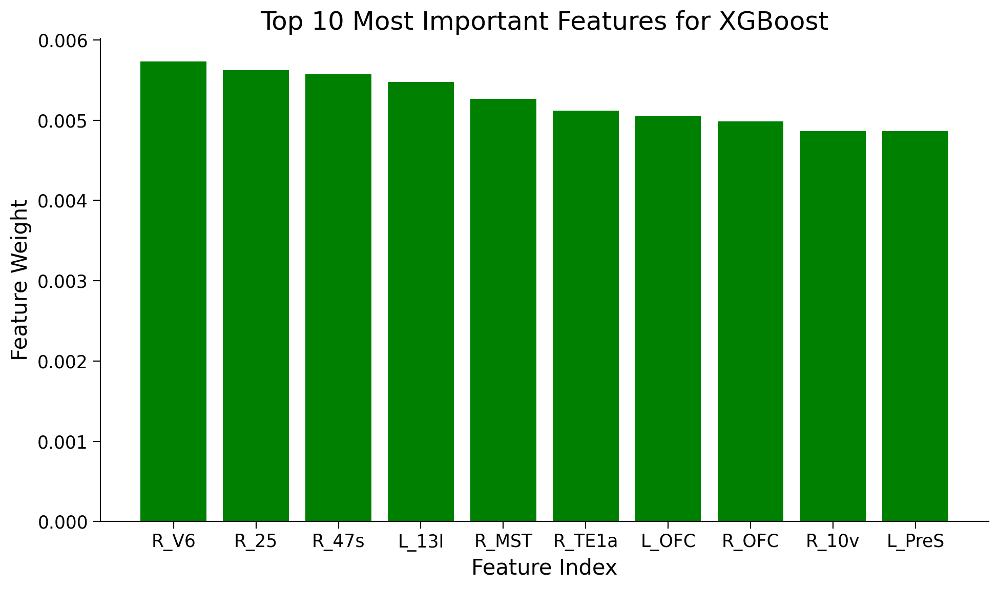

In [ ]:
def average_feature_weights(feature_weights_all):
    num_subjects = len(feature_weights_all)

    # Initialize an array to hold the sum of weights for each feature index
    total_weights = np.zeros(360)

    # Iterate over each subject
    for subject in feature_weights_all:
        # Convert subject data to numpy array if it's not already
        subject_array = np.array(subject)

        # Extract the feature weights (second column)
        weights = subject_array[:, 1]

        # Accumulate the weights
        total_weights += weights

    # Calculate the average weights
    average_weights = total_weights / num_subjects

    return average_weights

# Calculate the average feature weights
average_weights = average_feature_weights(xgb_feature_weights_all)

# Create a list of tuples containing feature indices and corresponding weights
feature_weights_list = list(enumerate(average_weights))
feature_name_list = [feature_weights_list[i] + (feature_names[i],) for i in range(len(feature_weights_list))]
# Sort the feature weights in descending order of absolute values
sorted_feature_weights = sorted(feature_name_list, key=lambda x: x[1], reverse=True)
top_10_features = sorted_feature_weights[:10]

top_feature_indices = []
top_feature_names = []
top_feature_weights = []
for i in range(len(top_10_features)):
    top_feature_indices.append(top_10_features[i][0])
    top_feature_weights.append(top_10_features[i][1])
    top_feature_names.append(top_10_features[i][2])

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(top_feature_names)), top_feature_weights, align='center', color="Green")
plt.xticks(range(len(top_feature_names)), top_feature_names)
plt.xlabel('Feature Index')
plt.ylabel('Feature Weight')
plt.title('Top 10 Most Important Features for XGBoost')
plt.show()


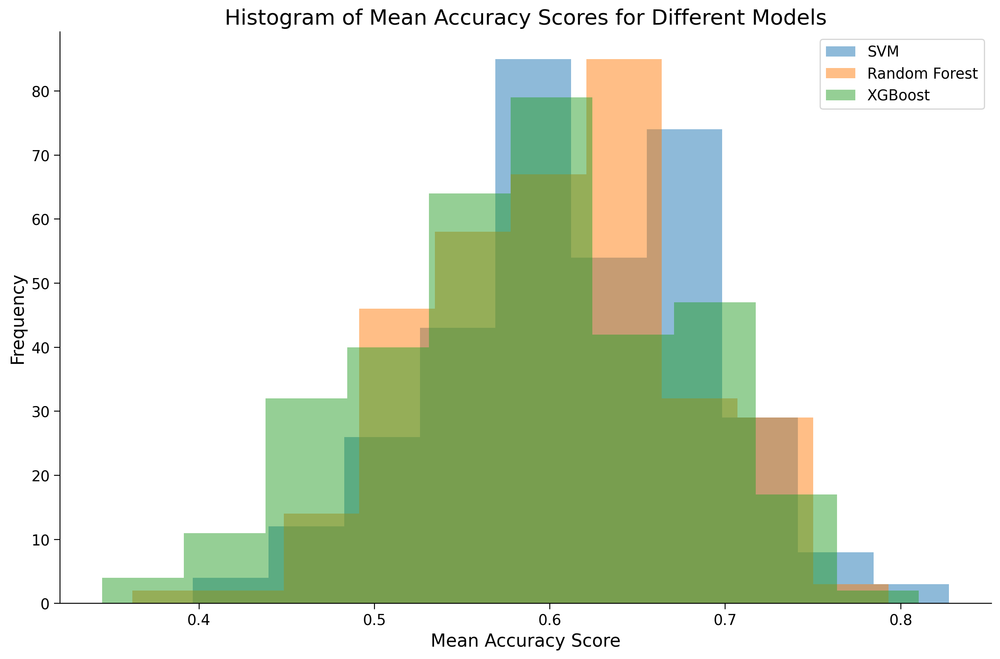

In [ ]:
plt.figure(figsize=(12, 8))
plt.hist(svc_mean_acc_scores_all, alpha=0.5, label='SVM', bins=10)
plt.hist(rf_mean_acc_scores_all, alpha=0.5, label='Random Forest', bins=10)
plt.hist(xgb_mean_acc_scores_all, alpha=0.5, label='XGBoost', bins=10)

# Add labels and title
plt.xlabel('Mean Accuracy Score')
plt.ylabel('Frequency')
plt.title('Histogram of Mean Accuracy Scores for Different Models')
plt.legend(loc='upper right')

# Show the plot
plt.show()

In [ ]:
# Combine subjects and their mean accuracy scores into a list of tuples
subject_scores = list(zip(subjects, xgb_mean_acc_scores_all))

# Sort the list by mean accuracy scores in descending order
sorted_subject_scores = sorted(subject_scores, key=lambda x: x[1], reverse=True)

# Get the top 10 subjects with the best accuracy scores
top_10_subjects = sorted_subject_scores[:10]

# Extract the subject names and their scores
top_10_subject_names = [subject for subject, score in top_10_subjects]
top_10_subject_scores = [score for subject, score in top_10_subjects]

# Print the top 10 subjects and their scores
print("Top 10 subjects with the best accuracy scores:")
for subject, score in zip(top_10_subject_names, top_10_subject_scores):
    print(f"Subject: {subject}, Accuracy Score: {score}")

Top 10 subjects with the best accuracy scores:
Subject: 307, Accuracy Score: 0.8103448275862069
Subject: 211, Accuracy Score: 0.7758620689655172
Subject: 136, Accuracy Score: 0.7586206896551724
Subject: 173, Accuracy Score: 0.7586206896551724
Subject: 238, Accuracy Score: 0.7586206896551724
Subject: 282, Accuracy Score: 0.7586206896551724
Subject: 79, Accuracy Score: 0.7413793103448276
Subject: 114, Accuracy Score: 0.7413793103448276
Subject: 118, Accuracy Score: 0.7413793103448276
Subject: 121, Accuracy Score: 0.7413793103448276
